In [1]:
import numpy as np
import matplotlib.pyplot as plt
from netCDF4 import Dataset, num2date
from matplotlib.colors import LogNorm
from matplotlib import cm
import matplotlib
from scipy import stats
import copy
from function import confid

import cartopy.crs as ccrs                   # import projections
import cartopy

from scipy.io import loadmat

In [2]:
plt.rcParams['figure.figsize'] = (8,5)
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 400
plt.close('all')

__figdir__ = './fig/' + 'Tom_'
savefig_args = {'bbox_inches':'tight', 'pad_inches':0.2}

In [3]:
xmin, xmax = (125,290)
ymin, ymax = (-28,61)

In [4]:
savefig = True # flag to write plots to files
plotswot = False # flag to include plot of SWOT cal/val track
if plotswot:
    mat = loadmat('data/SWOTOrbit.mat')
    lon_calval = mat['lon_calval']
    lat_calval = mat['lat_calval']

In [5]:
# data for fft of running avergaed filtered ssh
# path = '/vortexfs1/home/wwu/Rossby_Wave_Project/data/fft_filtered_hann_detrend_ssh_14yrs_all_freqs.nc'
path = 'data/fft_filtered_hann_detrend_ssh_14yrs_all_freqs.nc'
nc = Dataset(path,'r')
lon,lat = np.meshgrid(nc.variables['lon'][:],nc.variables['lat'][:])
lon =360*(lon<0)+lon
fft_h = nc.variables['fftreal'][150:160,:,:] \
       + 1j* nc.variables['fftimg'][150:160,:,:]
N = 1022. # number of data points (use later to normalize fft output)
# the spacing of frequency 
df = nc.variables['cycle_per_day'][1]- nc.variables['cycle_per_day'][0]
#Spectrum by averaging over 10 frequency bands 
S_h = np.mean(2.*(np.absolute(fft_h)**2.)/(N**2. * df),axis = 0)
#error bar at the 95% confidence interval
# should this nu be /1.9445
nu = 2*len(nc.variables['cycle_per_day'][150:160])/1.9445
alpha = 0.05
lower, upper = confid(alpha, nu)

# data for fft of 0.1 degree resolution ssh
#path1= '/vortexfs1/home/wwu/Rossby_Wave_Project/data/fft_resample_hann_detrend_ssh_14yrs_all_freqs.nc'
path1='data/fft_resample_hann_detrend_ssh_14yrs_all_freqs.nc'
nc1 = Dataset(path1,'r')
fft_h_2 = nc1.variables['fftreal'][150:160,:,:] \
       + 1j* nc1.variables['fftimg'][150:160,:,:]
S_h_2 = np.mean(2.*(np.absolute(fft_h_2)**2.)/(N**2. * df),axis = 0)

loc = np.empty(2,) # index of reference point
loc[0] = 354
loc[1] = 1100

<ipython-input-5-c5684bb93460>:5: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  lon,lat = np.meshgrid(nc.variables['lon'][:],nc.variables['lat'][:])
<ipython-input-5-c5684bb93460>:7: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  fft_h = nc.variables['fftreal'][150:160,:,:] \
<ipython-input-5-c5684bb93460>:8: DeprecationWarning: `np.bool` is a depre

In [6]:
#Coherence/phase for space filtered SSH
fft_ref = fft_h[:,int(loc[0]),int(loc[1])]
cp = fft_h*np.conjugate(fft_ref)[...,np.newaxis,np.newaxis]
C_lf = np.mean(2.*cp/(N**2. * df),axis = 0)
trans_func = C_lf/S_h[int(loc[0]),int(loc[1])]
phi1 = np.arctan2(np.imag(trans_func),np.real(trans_func))
coh1 = np.absolute(C_lf)**2./(S_h*S_h[int(loc[0]),int(loc[1])])

#Coherence/phase for non-filtered 0.1degree resolution SSH
fft_ref = fft_h_2[:,int(loc[0]),int(loc[1])]
cp = fft_h_2*np.conjugate(fft_ref)[...,np.newaxis,np.newaxis]
C_lf = np.mean(2.*cp/(N**2. * df),axis = 0)
trans_func = C_lf/S_h_2[int(loc[0]),int(loc[1])]
phi2 = np.arctan2(np.imag(trans_func),np.real(trans_func))
coh2 = np.absolute(C_lf)**2./(S_h_2*S_h_2[int(loc[0]),int(loc[1])])

#Coherence error bar (dof for hann window is considered)
errbar = np.sqrt(1.-(0.05)**(1./( (10/1.9445) -1))) 

In [7]:
## Coherence of SSH without smoothing

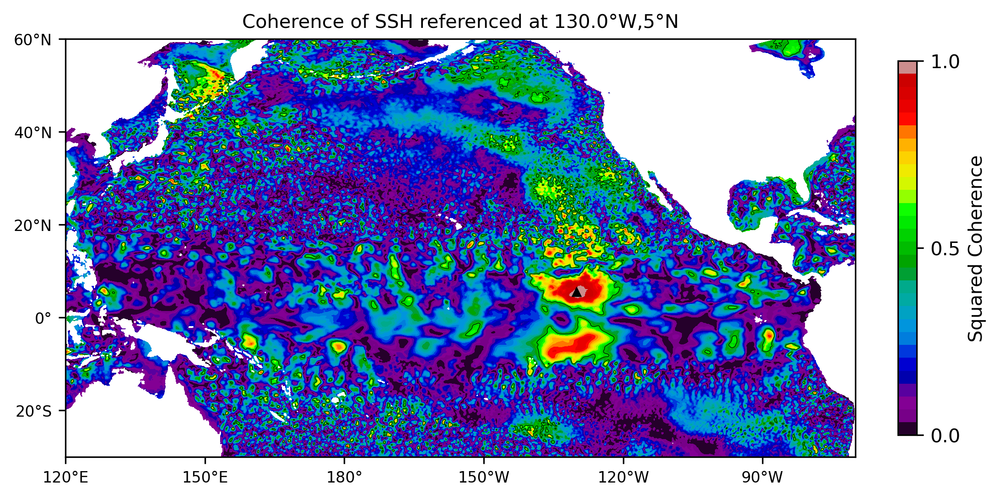

<Figure size 2400x1500 with 0 Axes>

In [8]:
# Try a slightly different plot style:
fig = plt.figure()
degree_sign= u'\N{DEGREE SIGN}'
current_cmap = copy.copy(plt.get_cmap('nipy_spectral'))
current_cmap.set_bad(color='0.6')
#bar = np.linspace(0,1,200)
levels=np.linspace(0,1,30)
cs = plt.contourf(lon,lat,coh2,levels,cmap = current_cmap)
plt.axis('scaled')
cb = plt.colorbar(cs,ticks = [0,0.5,1.0],fraction = 0.022)
cb.set_label('Squared Coherence',fontsize = 10)
plt.contour(lon,lat,coh2,[errbar**2.],colors= 'white',linewidths = 0.3)

x0 = lon[int(loc[0]),int(loc[1])]
y0 = lat[int(loc[0]),int(loc[1])]
plt.plot(x0, y0, marker='^',color='black',markersize = 4)


plt.xticks([120,150,180,210,240,270],['120'+degree_sign+'E', '150'+degree_sign+'E','180'+degree_sign, '150'+degree_sign+'W','120'+degree_sign+'W','90'+degree_sign+'W'],fontsize = 8)
plt.yticks([-20,0,20,40,60],['20'+degree_sign+'S','0'+degree_sign, '20'+degree_sign+'N', '40'+degree_sign+'N', '60'+degree_sign+'N'],fontsize = 8)
plt.title('Coherence of SSH referenced at '+\
          str(round(360-x0,1))+degree_sign+'W,'+str(int(y0))+degree_sign+'N',size =10.)


#plt.savefig('Coherence_unfiltered_SSH.png',dpi = 300,bbox_inches='tight', pad_inches=0)

plt.set_cmap(cmap=plt.get_cmap('nipy_spectral'))
fig = plt.figure()

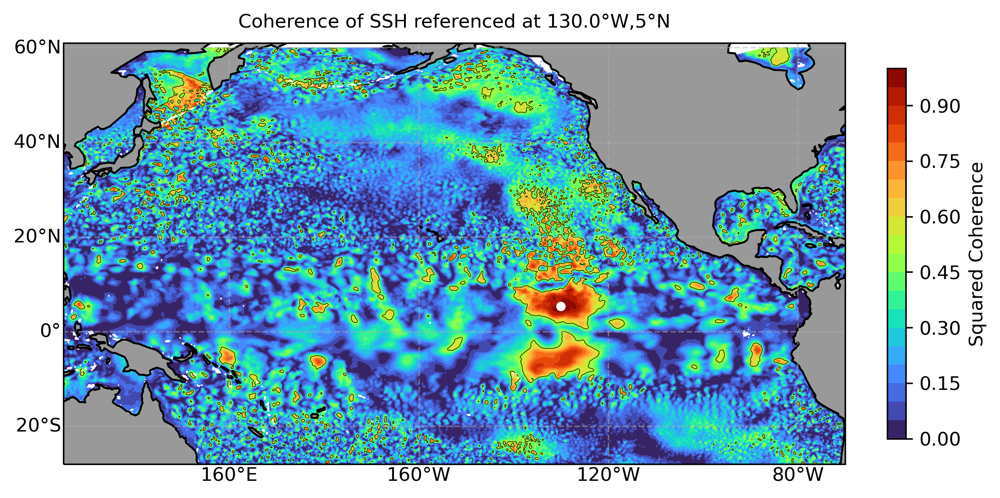

In [9]:
# %matplotlib qt 
###########################################
fig = plt.figure()
ax = plt.axes(projection = ccrs.PlateCarree(central_longitude=200))  # Orthographic
extent = [xmin, xmax, ymin, ymax]
ax.set_extent(extent, crs=ccrs.PlateCarree())
ax.set_title('Coherence of SSH referenced at '+\
          str(round(360-x0,1))+degree_sign+'W,'+str(int(y0))+degree_sign+'N',size =10.)

plt.set_cmap(cmap=plt.get_cmap('turbo'))
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, alpha=0.5, linestyle='--')
gl.top_labels = False
gl.xlocator = matplotlib.ticker.MaxNLocator(10)
# gl.xlocator = matplotlib.ticker.FixedLocator(np.arange(130, 230,10))

ax.coastlines()
ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor=[.6,.6,.6], edgecolor='black')
levels = np.linspace(0,1,21)
cs = ax.contourf(lon,lat,coh2, levels, transform=ccrs.PlateCarree())
plt.contour(lon,lat,coh2,[errbar**2.],colors= 'black',linewidths = 0.3, transform=ccrs.PlateCarree())
cb = plt.colorbar(cs,fraction = 0.022)
cb.set_label('Squared Coherence',fontsize = 10)

x0 = lon[int(loc[0]),int(loc[1])]
y0 = lat[int(loc[0]),int(loc[1])]
plt.plot(x0, y0, marker='o',color='white',transform=ccrs.PlateCarree(),markersize = 4);

if plotswot:
    plt.plot(lon_calval,lat_calval,'.',color='white',markersize=1,transform=ccrs.PlateCarree());
if savefig:
    plt.savefig(__figdir__+'SSH_coher_raw.pdf',**savefig_args)


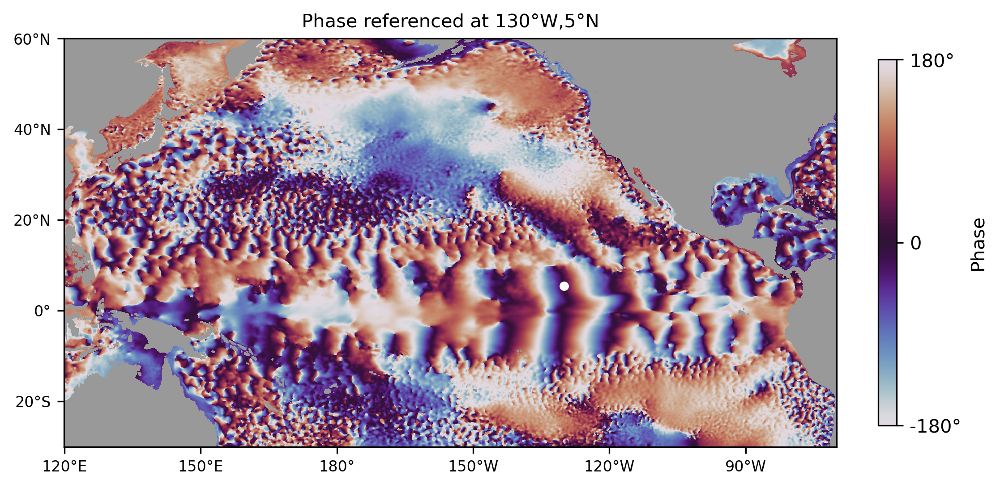

In [10]:
fig = plt.figure()
current_cmap = copy.copy(plt.cm.get_cmap('twilight'))
current_cmap.set_bad(color='0.6')
cs = plt.pcolormesh(lon,lat,phi2,shading = 'nearest',\
                    vmin = -np.pi,vmax= np.pi,cmap = current_cmap)
plt.axis('scaled')
cb = plt.colorbar(cs,fraction = 0.022)
cb.set_label('Phase',fontsize = 10)
cb.set_ticks([-np.pi,0,np.pi])
cb.set_ticklabels(['-180'+degree_sign,'0','180'+degree_sign])


x0 = lon[int(loc[0]),int(loc[1])]
y0 = lat[int(loc[0]),int(loc[1])]
plt.plot(x0, y0, marker='o',color='white',markersize = 4)


plt.xticks([120,150,180,210,240,270],['120'+degree_sign+'E', '150'+degree_sign+'E','180'+degree_sign, '150'+degree_sign+'W','120'+degree_sign+'W','90'+degree_sign+'W'],fontsize = 8)
plt.yticks([-20,0,20,40,60],['20'+degree_sign+'S','0'+degree_sign, '20'+degree_sign+'N', '40'+degree_sign+'N', '60'+degree_sign+'N'],fontsize = 8)
plt.title('Phase referenced at '+\
          str(int(360-x0))+degree_sign+'W,'+str(int(y0))+degree_sign+'N',size =10.)

#plt.savefig('Phase_unfiltered_SSH.png',dpi = 300,bbox_inches='tight', pad_inches=0)


plt.show()

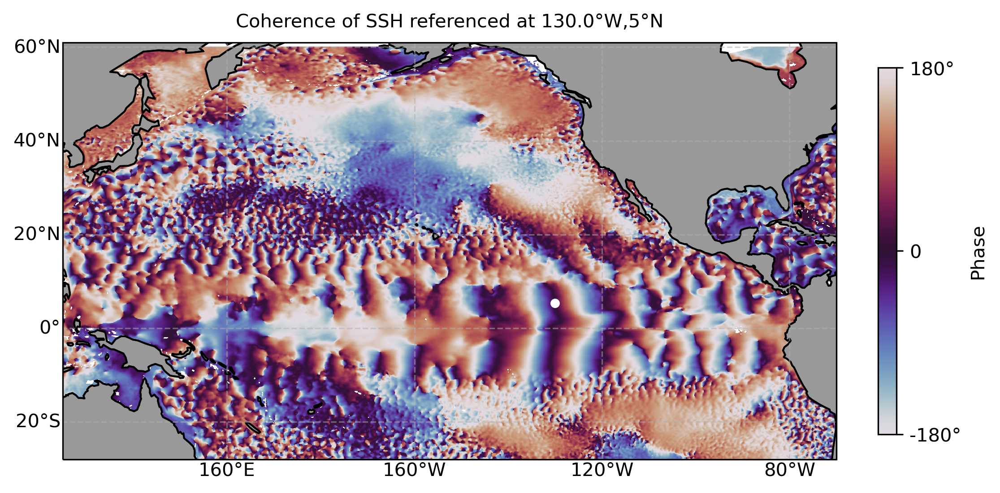

In [11]:
# %matplotlib qt 
###########################################
fig = plt.figure()
ax = plt.axes(projection = ccrs.PlateCarree(central_longitude=200))  # Orthographic
extent = [xmin, xmax, ymin, ymax]
ax.set_extent(extent, crs=ccrs.PlateCarree())
ax.set_title('Coherence of SSH referenced at '+\
          str(round(360-x0,1))+degree_sign+'W,'+str(int(y0))+degree_sign+'N',size =10.)

plt.set_cmap(cmap=plt.get_cmap('twilight'))
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, alpha=0.5, linestyle='--')
gl.top_labels = False
gl.xlocator = matplotlib.ticker.MaxNLocator(10)
# gl.xlocator = matplotlib.ticker.FixedLocator(np.arange(130, 230,10))

ax.coastlines()
ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor=[.6,.6,.6], edgecolor='black')

cs = plt.pcolormesh(lon,lat,phi2,shading = 'nearest',\
                    vmin = -np.pi,vmax= np.pi,transform=ccrs.PlateCarree())
cb = plt.colorbar(cs,fraction = 0.022)
cb.set_label('Phase',fontsize = 10)
cb.set_ticks([-np.pi,0,np.pi])
cb.set_ticklabels(['-180'+degree_sign,'0','180'+degree_sign])

x0 = lon[int(loc[0]),int(loc[1])]
y0 = lat[int(loc[0]),int(loc[1])]
plt.plot(x0, y0, marker='o',color='white',transform=ccrs.PlateCarree(),markersize = 4);
if plotswot:
    plt.plot(lon_calval,lat_calval,'.',color='white',markersize=1,transform=ccrs.PlateCarree());

if savefig:
    plt.savefig(__figdir__+'SSH_coher_phase_raw.pdf',**savefig_args)


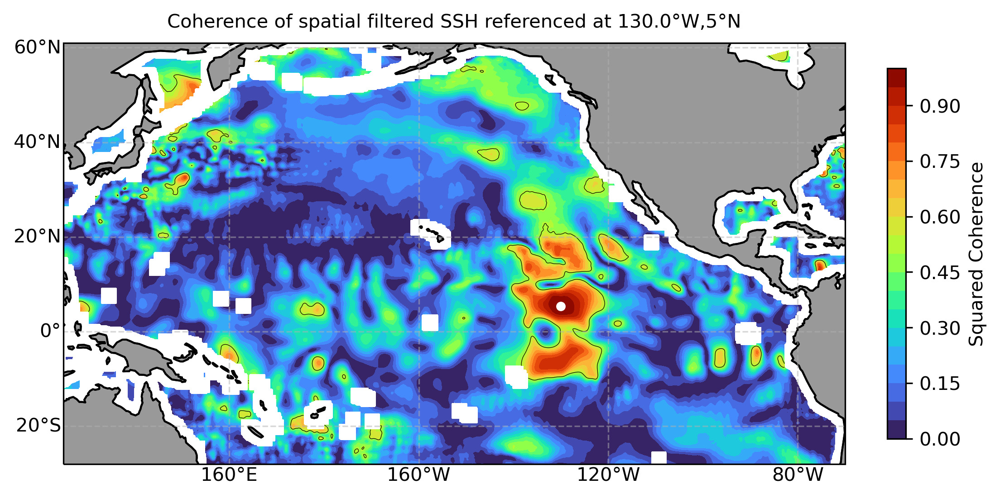

In [12]:
# %matplotlib qt 
###########################################
fig = plt.figure()
ax = plt.axes(projection = ccrs.PlateCarree(central_longitude=200))  # Orthographic
extent = [xmin, xmax, ymin, ymax]
ax.set_extent(extent, crs=ccrs.PlateCarree())
ax.set_title('Coherence of spatial filtered SSH referenced at '+\
          str(round(360-x0,1))+degree_sign+'W,'+str(int(y0))+degree_sign+'N',size =10.)

plt.set_cmap(cmap=plt.get_cmap('turbo'))
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, alpha=0.5, linestyle='--')
gl.top_labels = False
gl.ylabels_right = False
gl.xlocator = matplotlib.ticker.MaxNLocator(10)
# gl.xlocator = matplotlib.ticker.FixedLocator(np.arange(130, 230,10))

ax.coastlines()
ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor=[.6,.6,.6], edgecolor='black')
levels = np.linspace(0,1,21)
cs = ax.contourf(lon,lat,coh1, levels, transform=ccrs.PlateCarree())
plt.contour(lon,lat,coh1,[errbar**2.],colors= 'black',linewidths = 0.3, transform=ccrs.PlateCarree())
cb = plt.colorbar(cs,fraction = 0.022)
cb.set_label('Squared Coherence',fontsize = 10)

x0 = lon[int(loc[0]),int(loc[1])]
y0 = lat[int(loc[0]),int(loc[1])]
plt.plot(x0, y0, marker='o',color='white',transform=ccrs.PlateCarree(),markersize = 4);

if plotswot:
    plt.plot(lon_calval,lat_calval,'.',color='white',markersize=1,transform=ccrs.PlateCarree());
if savefig:
    plt.savefig(__figdir__+'SSH_coher_smoothed.pdf',**savefig_args)


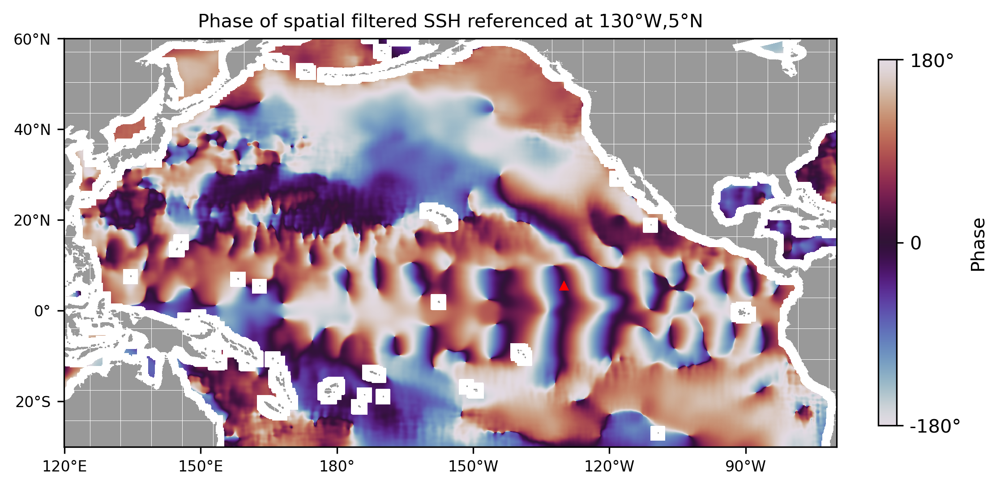

In [15]:
fig = plt.figure(dpi = 300)
current_cmap = copy.copy(plt.cm.get_cmap('twilight'))
current_cmap.set_bad(color='1.0')
cs = plt.pcolormesh(lon,lat,phi1,shading = 'nearest',vmin = -np.pi,vmax= np.pi,cmap = current_cmap)
plt.axis('scaled')
cb = plt.colorbar(cs,fraction = 0.022)
cb.set_label('Phase',fontsize = 10)
cb.set_ticks([-np.pi,0,np.pi])
cb.set_ticklabels(['-180'+degree_sign,'0','180'+degree_sign])

x0 = lon[int(loc[0]),int(loc[1])]
y0 = lat[int(loc[0]),int(loc[1])]
plt.plot(x0, y0, marker='^',color='red',markersize = 4)

plt.scatter(lon[coh2.mask],lat[coh2.mask],color='0.6',marker=',',lw = 0.0,s=(72./fig.dpi)**2)

plt.xticks([120,150,180,210,240,270],['120'+degree_sign+'E', '150'+degree_sign+'E','180'+degree_sign, '150'+degree_sign+'W','120'+degree_sign+'W','90'+degree_sign+'W'],fontsize = 8)
plt.yticks([-20,0,20,40,60],['20'+degree_sign+'S','0'+degree_sign, '20'+degree_sign+'N', '40'+degree_sign+'N', '60'+degree_sign+'N'],fontsize = 8)
plt.title('Phase of spatial filtered SSH referenced at '+\
          str(int(360-x0))+degree_sign+'W,'+str(int(y0))+degree_sign+'N',size =10.)

if savefig:
    plt.savefig(__figdir__+'SSH_coher_phase_smoothed.pdf',**savefig_args)

plt.show()